# Using Kmeans for customer segmentation 

In [1]:
import pandas as pd 

In [2]:
clean_df =pd.read_csv('final_data.csv')

In [5]:
clean_df.drop(columns=('Unnamed: 0'),inplace=True)

In [77]:
clean_df.set_index('customer_id', inplace = True)

In [78]:
clean_df.drop(columns=('class'), inplace=True)

In [128]:
clean_df.drop(columns=('item_id'),inplace = True)

In [129]:
import plotly.express as px
import hvplot.pandas
from sklearn.cluster import KMeans

# using the eblow curve to figure out how many clusters we need 

inertia = []
k = list(range(1, 11))

# Calculate the inertia for the range of k values
for i in k:
    km = KMeans(n_clusters=i, random_state=0)
    km.fit(clean_df)
    inertia.append(km.inertia_)

# Create the Elbow Curve using hvPlot
elbow_data = {"k": k, "inertia": inertia}
df_elbow = pd.DataFrame(elbow_data)
df_elbow.hvplot.line(x="k", y="inertia", xticks=k, title="Elbow Curve")

:Curve   [k]   (inertia)

In [153]:
# function that returns a new df 
def get_clusters(k, data):
    # Initialize the K-Means model
    model = KMeans(n_clusters=k, random_state=1)

    # Fit the model
    model.fit(data)

    # Predict clusters
    predictions = model.predict(data)

    # Create return DataFrame with predicted clusters
    data["class"] = model.labels_

    return data

In [104]:
kmeans_df = get_clusters(3,clean_df)

In [105]:
# looking to see how many clusters we have 
kmeans_df['class'].unique()

array([2, 0, 1], dtype=int32)

In [131]:
kmeans_df.columns

Index(['quantity', 'selling_price', 'other_discount', 'coupon_discount',
       'age_range', 'marital_status', 'rented', 'family_size',
       'no_of_children', 'income_bracket', 'brand_type', 'redemption_status',
       'campaign_type', 'class'],
      dtype='object')

In [132]:
# Plotting the 2D-Scatter with x="Annual Income" and y="Spending Score (1-100)"
#kmeans_df.hvplot.scatter(x="redemption_status", y="selling_price", by="class")

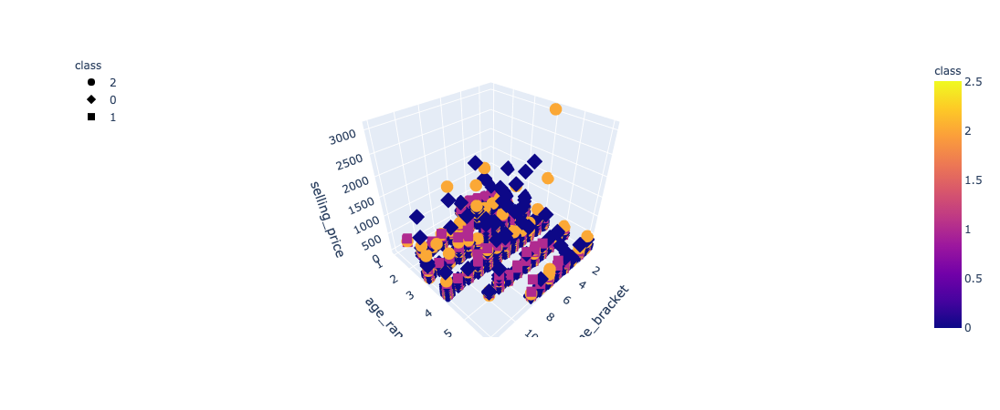

In [134]:
# Plotting the clusters with three features
fig = px.scatter_3d(
   kmeans_df,
    x="income_bracket",
    y="age_range",
    z="selling_price",
    color="class",
    symbol="class",
    width=800,
)
fig.update_layout(legend=dict(x=0, y=1))
fig.show()

# Using PCA analysis 

In [135]:
### PCA ANALYSIS
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [136]:
# scaling the data 
scaled = StandardScaler().fit_transform(clean_df)

In [138]:
# Creating the PCA instance
#n_components = 16 for the number of columns
pca = PCA(n_components=14)
principalComponents = pca.fit_transform(scaled)

([<matplotlib.axis.XTick at 0x7f9661066580>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

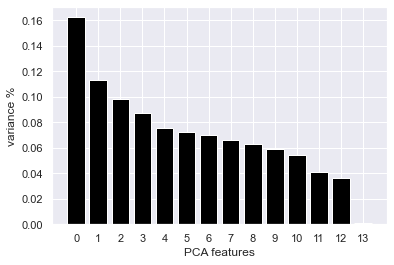

In [139]:
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)

In [141]:
# Save components to a DataFrame to be able to plot 
PCA_components = pd.DataFrame(
    data = principalComponents,
    columns=['PCA1','PCA2','PCA3','PCA4','PCA5','PCA6','PCA7','PCA8','PCA9','PCA10','PCA11','PCA12','PCA13','PCA14'])
PCA_components

,PCA1,PCA2,PCA3,PCA4,PCA5,PCA6,PCA7,PCA8,PCA9,PCA10,PCA11,PCA12,PCA13,PCA14
0,-2.095940,-0.445404,-1.29455,-0.668013,-0.240406,0.721307,0.478832,-0.788498,0.002972,0.165311,0.576589,0.624886,-1.981312,-0.126189
1,-2.095940,-0.445404,-1.29455,-0.668013,-0.240406,0.721307,0.478832,-0.788498,0.002972,0.165311,0.576589,0.624886,-1.981312,-0.126189
2,-2.095940,-0.445404,-1.29455,-0.668013,-0.240406,0.721307,0.478832,-0.788498,0.002972,0.165311,0.576589,0.624886,-1.981312,-0.126189
3,-2.095940,-0.445404,-1.29455,-0.668013,-0.240406,0.721307,0.478832,-0.788498,0.002972,0.165311,0.576589,0.624886,-1.981312,-0.126189
4,-2.095940,-0.445404,-1.29455,-0.668013,-0.240406,0.721307,0.478832,-0.788498,0.002972,0.165311,0.576589,0.624886,-1.981312,-0.126189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
261193,-1.232478,-0.255346,1.28035,-1.359054,0.432126,0.031870,-0.468415,-0.772206,-2.121861,2.843060,0.190501,0.633686,0.580810,-0.059871
261194,-1.232478,-0.255346,1.28035,-1.359054,0.432126,0.031870,-0.468415,-0.772206,-2.121861,2.843060,0.190501,0.633686,0.580810,-0.059871
261195,-1.232478,-0.255346,1.28035,-1.359054,0.432126,0.031870,-0.468415,-0.772206,-2.121861,2.843060,0.190501,0.633686,0.580810,-0.059871
261196,-1.232478,-0.255346,1.28035,-1.359054,0.432126,0.031870,-0.468415,-0.772206,-2.121861,2.843060,0.190501,0.633686,0.580810,-0.059871


Text(0, 0.5, 'PCA 2')

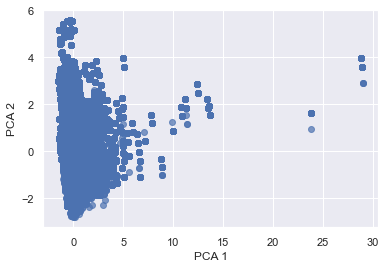

In [179]:
# plotting two features 
plt.scatter(PCA_components['PCA2'], PCA_components['PCA3'], alpha=.7, edgecolors='b', cmap='rainbow')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')

In [ ]:
# creating a 3d scatter plot based on PCA features 
fig = px.scatter_3d(
    PCA_components,
    x='PCA1',
    y='PCA2',
    z='PCA3',
    color='PCA3',
    symbol='PCA3',
    width=800,
)
fig.update_layout(legend=dict(x=0, y=1))
fig.show()

In [167]:
clean_df.coupon_discount.value_counts()

 0.00      258203
-35.62       1411
-19.59       1021
-12.47        165
-17.81        158
-37.40         57
-72.31         57
-117.19        52
-14.25         38
-142.12        36
Name: coupon_discount, dtype: int64

In [186]:
# Initialize the K-Means model
new_model = KMeans(n_clusters=3, random_state=1)
# Fit the model
new_model.fit(clean_df)

KMeans(n_clusters=3, random_state=1)

## Using siloutette scoring to access the quality of the Kmeans clusters 

In [192]:
# Calculate Silhoutte Score
from sklearn import metrics
#from sklearn.metrics import silhouette_score

labels = new_model.labels_

In [193]:
score = metrics.silhouette_score(clean_df,labels, metric='euclidean')

In [195]:
# as the clusters become more defined the score increases closer to 1 
print(f'This is the silouette score based on using 3 clusters: {score}')

This is the silouette score based on using 3 clusters: 0.6464830613293536


In [196]:
# running the silouette score using 4 clusters 
model_4k = KMeans(n_clusters=4, random_state=1)
# Fit the model
model_4k.fit(clean_df)

KMeans(n_clusters=4, random_state=1)

In [197]:
labels = model_4k.labels_

In [198]:
score_4k = metrics.silhouette_score(clean_df,labels, metric='euclidean')

In [199]:
score_4k

0.48554301579423775